<a href="https://colab.research.google.com/github/shubham1m/MusicGeneration/blob/main/MusicWithLSTM_Notations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Setup

In [ ]:
!pip install music21==5.3.0

     |████████████████████████████████| 18.0MB 1.2MB/s 
  Created wheel for music21: filename=music21-5.3.0-cp37-none-any.whl size=21291740 sha256=8c6ad14ca007c0b6324998219bf696817b3968ddf2f7ab1a520de0fca685c805
  Stored in directory: /root/.cache/pip/wheels/53/8b/a6/be1921c60a68f0bea31c6b6a0a7b125badd61294d6a694407f
Successfully built music21
  Found existing installation: music21 5.5.0
    Uninstalling music21-5.5.0:
      Successfully uninstalled music21-5.5.0


In [1]:
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('done!')

installing lilypond...
Extracting templates from packages: 100%
installing fluidsynth...
done!


In [ ]:
import music21
from IPython.display import Image, Audio

In [ ]:
!fluidsynth --version
print('-------------------------')
!lilypond --version
print('-------------------------')
music21.__version__

FluidSynth version 1.1.9
Copyright (C) 2000-2018 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

FluidSynth 1.1.9
-------------------------
GNU LilyPond 2.18.2

Copyright (c) 1996--2012 by
  Han-Wen Nienhuys <hanwen@xs4all.nl>
  Jan Nieuwenhuizen <janneke@gnu.org>
  and others.

This program is free software.  It is covered by the GNU General Public
License and you are welcome to change it and/or distribute copies of it
under certain conditions.  Invoke as `lilypond --warranty' for more
information.

-------------------------


'5.3.0'

#Import Data & Generate Notation

In [ ]:
from music21 import converter, chord, note
path = '/content/drive/MyDrive/ColabNotebooks/data'
dataset_name = 'classical'
filename = 'bach_847'
file = "{}/{}/{}.mid".format(path, dataset_name, filename)

original_score = converter.parse(file).chordify()

In [ ]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(filename + '.wav'))

In [ ]:
#play_score = original_score.stream()
play(original_score)

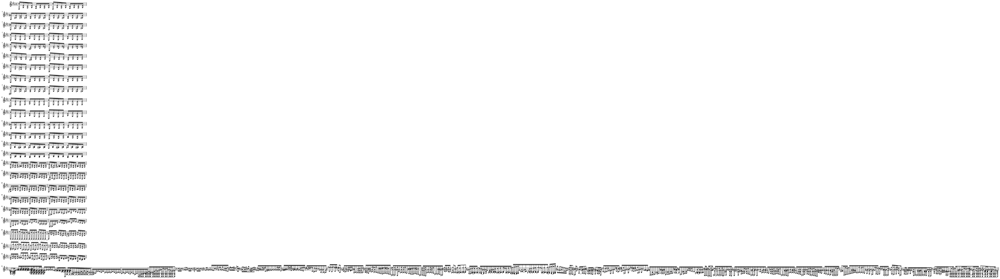

In [ ]:
#show_score = original_score.notes
show(original_score)

In [ ]:
original_score.show('text')

{0.0} <music21.instrument.Piano Piano>
{0.0} <music21.tempo.MetronomeMark Quarter=122.5>
{0.0} <music21.tempo.MetronomeMark allegro Quarter=133.0>
{0.0} <music21.key.Key of E- major>
{0.0} <music21.meter.TimeSignature 4/4>
{0.0} <music21.chord.Chord C3 C5>
{0.25} <music21.chord.Chord G3 E-4>
{0.5} <music21.chord.Chord F3 D4>
{0.75} <music21.tempo.MetronomeMark allegro moderato Quarter=126.0>
{0.75} <music21.chord.Chord G3 E-4>
{1.0} <music21.tempo.MetronomeMark allegro moderato Quarter=127.5>
{1.0} <music21.chord.Chord E-3 C4>
{1.25} <music21.tempo.MetronomeMark allegro Quarter=132.5>
{1.25} <music21.chord.Chord G3 E-4>
{1.5} <music21.chord.Chord F3 D4>
{1.75} <music21.tempo.MetronomeMark allegro moderato Quarter=126.0>
{1.75} <music21.chord.Chord G3 E-4>
{2.0} <music21.tempo.MetronomeMark Quarter=123.5>
{2.0} <music21.chord.Chord C3 C5>
{2.25} <music21.tempo.MetronomeMark allegro Quarter=133.5>
{2.25} <music21.chord.Chord G3 E-4>
{2.5} <music21.chord.Chord F3 D4>
{2.75} <music21.tempo

In [ ]:
notes = []
durations = []

for element in original_score.flat:
    
    if isinstance(element, chord.Chord):
        notes.append('.'.join(n.nameWithOctave for n in element.pitches))
        durations.append(element.duration.quarterLength)

    if isinstance(element, note.Note):
        if element.isRest:
            notes.append(str(element.name))
            durations.append(element.duration.quarterLength)
        else:
            notes.append(str(element.nameWithOctave))
            durations.append(element.duration.quarterLength)

In [ ]:
print('\nduration', 'pitch')
for n,d in zip(notes,durations):
    print(d, '\t', n)


duration pitch
0.25 	 C3.C5
0.25 	 G3.E-4
0.25 	 F3.D4
0.25 	 G3.E-4
0.25 	 E-3.C4
0.25 	 G3.E-4
0.25 	 F3.D4
0.25 	 G3.E-4
0.25 	 C3.C5
0.25 	 G3.E-4
0.25 	 F3.D4
0.25 	 G3.E-4
0.25 	 E-3.C4
0.25 	 G3.E-4
0.25 	 F3.D4
0.25 	 G3.E-4
0.25 	 C3.G#4
0.25 	 G#3.F4
0.25 	 G3.E4
0.25 	 G#3.F4
0.25 	 F3.C4
0.25 	 G#3.F4
0.25 	 G3.E4
0.25 	 G#3.F4
0.25 	 C3.G#4
0.25 	 G#3.F4
0.25 	 G3.E4
0.25 	 G#3.F4
0.25 	 F3.C4
0.25 	 G#3.F4
0.25 	 G3.E4
0.25 	 G#3.F4
0.25 	 C3.B4
0.25 	 G#3.F4
0.25 	 G3.E-4
0.25 	 G#3.F4
0.25 	 F3.D4
0.25 	 G#3.F4
0.25 	 G3.E-4
0.25 	 G#3.F4
0.25 	 C3.B4
0.25 	 G#3.F4
0.25 	 G3.E-4
0.25 	 G#3.F4
0.25 	 F3.D4
0.25 	 G#3.F4
0.25 	 G3.E-4
0.25 	 G#3.F4
0.25 	 C3.C5
0.25 	 E-3.G4
0.25 	 D3.F4
0.25 	 E-3.G4
0.25 	 G3.E-4
0.25 	 E-3.G4
0.25 	 D3.F4
0.25 	 E-3.G4
0.25 	 C3.C5
0.25 	 E-3.G4
0.25 	 D3.F4
0.25 	 E-3.G4
0.25 	 G3.E-4
0.25 	 E-3.G4
0.25 	 D3.F4
0.25 	 E-3.G4
0.25 	 C3.E-5
0.25 	 C4.G#4
0.25 	 B-3.G4
0.25 	 C4.G#4
0.25 	 G#3.E-4
0.25 	 C4.G#4
0.25 	 B-3.G4
0.25 	 C4.G